### Project Details - Regression

1. Objective
2. Data Description & Cleaning
3. Baseline Model
4. Wrangling & EDA (in Phython, SQL & Tableau)
5. Data Processing 
6. Applying & Validating the Models
- Linear Regression
- KNN Regression
- XGBoost
7. Displaying Prediction
8. Conclusion

In [1]:
import pandas as pd
import numpy as np

from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#from sklearn.preprocessing import StandardScaler
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import Normalizer

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
pd.set_option('display.max_columns', None)

In [2]:
data = pd.read_excel('regression_data.xls')
data.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,2014-10-13,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,2014-12-09,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2015-02-25,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,2014-12-09,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2015-02-18,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


## 1. Objective

**Objective**: 

The task is to build a model that will predict the price of a house based on features provided in the dataset. One of those parameters include understanding which factors are responsible for higher property value - \$650K and above. In short:

**“Predict selling prices of houses in King County, WA”**

## 2. Data Description & Cleaning

In [3]:
# Checking the datatypes. 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [4]:
# We are exploring the categories of the different variables to confirm the datatypes assigned.
data['bathrooms'].unique()
# data['id'].nunique()
# data['price'].unique().max()
# data['view'].value_counts()

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 0.75, 4.75, 5.  , 4.25, 3.75, 1.25, 5.25, 6.  , 0.5 , 5.5 ,
       6.75, 5.75, 8.  , 7.5 , 7.75, 6.25, 6.5 ])

**From a first exploration, we can derive the following information:**

- **id**: identification number for the property (21,420 properties are listed)
- **date**: date the house was sold (between May 2014 and May 2015)
- **bedrooms**: no. of bedrooms (between 1 and 33 bedrooms)
- **bathrooms**: no. of bathrooms (between 0.5 and 8 bathrooms)
- **sqft_living**: size of living area (between 370 and 13,540 sqft)
- **sqft_lot**: size of lot (between 520 and 1,651,359 sqft)
- **floors**: no. of floors (between 1 and 3.5 floors)
- **waterfront**: house which has a view to a waterfront (**1** with waterfront and **0** without)
- **view**: no. of times the house has been viewed by potential buyers (between 0 and 4 views)
- **condition**: how good the condition is (overall) (**1** indicates worn out property and **5** excellent)
- **grade**: overall grade given to the housing unit (**1** poor ,**13** excellent, properties between 3 and 13)
- **sqft_above**: square footage of house apart from basement
- **sqft_basement**: square footage of basement
- **yr_built**: year the house was built (between 1900 and 2015)
- **yr_renovated**: year the house was renovated (**0** never, or between 1934 and 2015)
- **zipcode**: zipcode of the location 
- **lat**: geographical latitude of the location
- **long**: geographical longitude of the location
- **sqft_living15**: living area in 2015 (implies previous renovations), this might have affected the lot size
- **sqft_lot15**: lot size in 2015 (implies previous renovations)
- **price**: price of the house (our target, between 78,000 and 7,700,000)

The id should be treated as a categorical value, since it is an identifier, not a discrete or continous numerical.

The zipcode will be treated as a categorical feature because we plan to use it to group or categorize properties by location (which entails other relevant factors such as demographic or socio-economic factors not provided in the dataset).

Hence the columns 'id' and 'zipcode' related to the location have to be changed to format 'object'.
The same applies to 'waterfront' (with or without) and 'view' (no. of views meaning interest in the property), 'condition' (rating of condition by 5 categories), and 'grade' (rating of grade from 1 to 13). They are categorical variables, but since they are already in the format of ordinal encoding/dummified, we want to use them as they are for the model.

In [5]:
# We change the datatype from int to object.
data[['id', 'zipcode']] = data[['id', 'zipcode']].astype(object)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  object        
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [6]:
# Now, we are checking for NaNs. There are none.
data.isna().sum()

id               0
date             0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
price            0
dtype: int64

In [7]:
# Checking for duplicates.
duplicates = data[data.duplicated(subset='id', keep=False)]

# We add a new column 'is_duplicate' to the duplicates dataframe
duplicates['is_duplicate'] = True

if duplicates.empty:
    print("No duplicates found")
else:
    print("Duplicates found:\n", duplicates)

Duplicates found:
                id       date  bedrooms  bathrooms  sqft_living  sqft_lot  \
93     6021501535 2014-07-25         3       1.50         1580      5000   
94     6021501535 2014-12-23         3       1.50         1580      5000   
313    4139480200 2014-06-18         4       3.25         4290     12103   
314    4139480200 2014-12-09         4       3.25         4290     12103   
324    7520000520 2014-09-05         2       1.00         1240     12092   
...           ...        ...       ...        ...          ...       ...   
20654  8564860270 2015-03-30         4       2.50         2680      5539   
20763  6300000226 2014-06-26         4       1.00         1200      2171   
20764  6300000226 2015-05-04         4       1.00         1200      2171   
21564  7853420110 2014-10-03         3       3.00         2780      6000   
21565  7853420110 2015-05-04         3       3.00         2780      6000   

       floors  waterfront  view  condition  grade  sqft_above  sqft_

In [8]:
21597-21420

177

We know that the data set consists of around 21,420 properties sold between May 2014 to May 2015. There are 21,597 entries in the dataset. Hence there are 177 duplicates based on the 'id' column. The reason here is that between May 2014 and May 2015 the same house has been sold twice, hence we need to keep both. But drop the 'id' column.

In [9]:
data.drop('id', axis=1, inplace=True)

In [10]:
data.to_csv('data_cleaned.csv')

## 3. Baseline Model

 ## 4. Wrangling & EDA (in Phython, SQL & Tableau)

In [11]:
eda_report = ProfileReport(data, title = "EDA Report - Properties")
eda_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The EDA report supports the previous findings. Now we check imbalance and deal with high correlation and multicollinearity, also indicated by the report. 

In [12]:
# Let's check the distribution of the different variables to further understand our dataset.
data.describe().round().T

,count,mean,std,min,25%,50%,75%,max
bedrooms,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,33.0
bathrooms,21597.0,2.0,1.0,0.0,2.0,2.0,2.0,8.0
sqft_living,21597.0,2080.0,918.0,370.0,1430.0,1910.0,2550.0,13540.0
sqft_lot,21597.0,15099.0,41413.0,520.0,5040.0,7618.0,10685.0,1651359.0
floors,21597.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0
waterfront,21597.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
view,21597.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0
condition,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,5.0
grade,21597.0,8.0,1.0,3.0,7.0,7.0,8.0,13.0
sqft_above,21597.0,1789.0,828.0,370.0,1190.0,1560.0,2210.0,9410.0


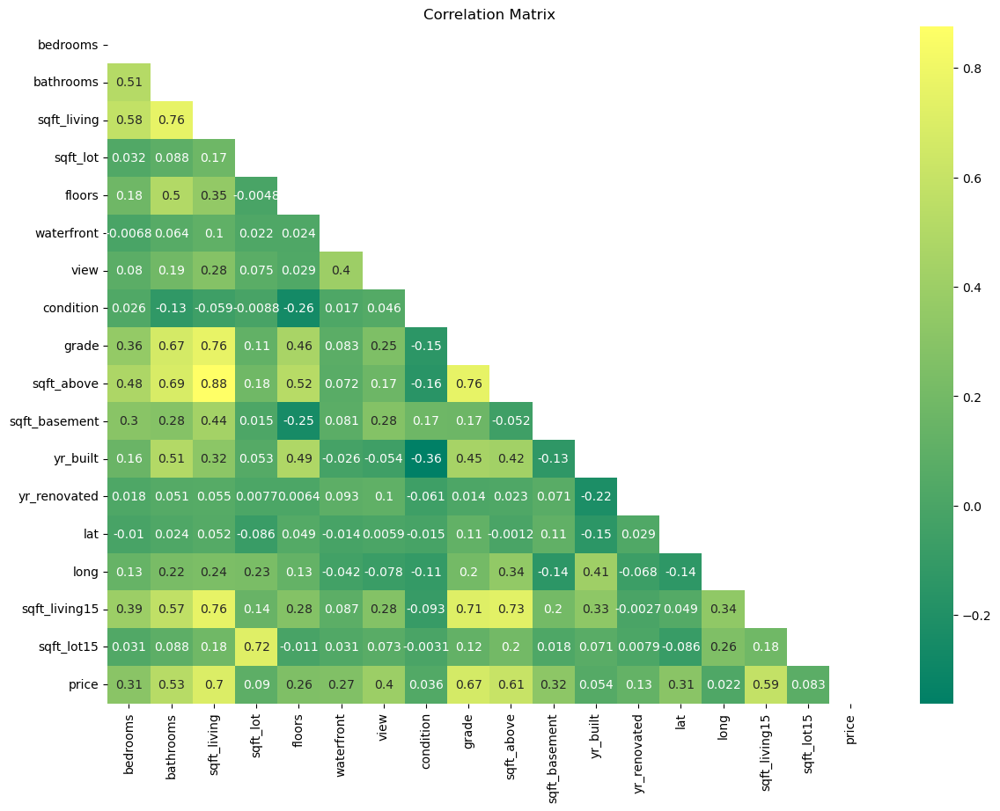

In [13]:
# We check the correlation between the numerical variables.
corr_matrix = data.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='summer')
plt.title('Correlation Matrix')
plt.show()

**Key findings from the EDA report confirmed by the heatmap:**

- bathrooms is **highly** correlated with sqft_living (0.76), has a medium correlation with floors, grade, sqft_above, yr_built, sqft_living15 and shows a good relation to the target.
- sqft_living has a **high** correlation with grade (0.76), sqft_above (0.88), and sqft_living15 (0.76) and shows the overall **best** relation with the target.
- sqft_lot is **highly** correlated with sqft_lot15 (0.72). sqft_lot shows a slightly better relation with the target.
- grade is **highly** correlated with sqft_living (as mentioned above, 0.76), sqft_above (as mentioned above, 0.76), sqft_living15 (0.71). sqft_above and sqft_living15 are also highly correlated (0.73). As well as with sqft_living (0.88 and 0.76 respectively). Of the four, sqft_living shows the best relation with the target (0.7).
- waterfront is **highly** correlated with view and viceversa.


- The target shows a good relation with sqft_living, grade, sqft_above, sqft_living15 and bathrooms.

Based on these findings we might want to drop the features 'bathrooms', 'sqft_lot15', 'grade', 'sqft_above' and 'sqft_living15'. Plotting the relations in Tableau these assumptions are mostly confirmed, e.g. we can observe that 'sqft_living' shows a better R2 score than 'sqft_living15'. We can drop 'grade' also because it provides us essentially with a similar information as 'condition' (as you can see below).  

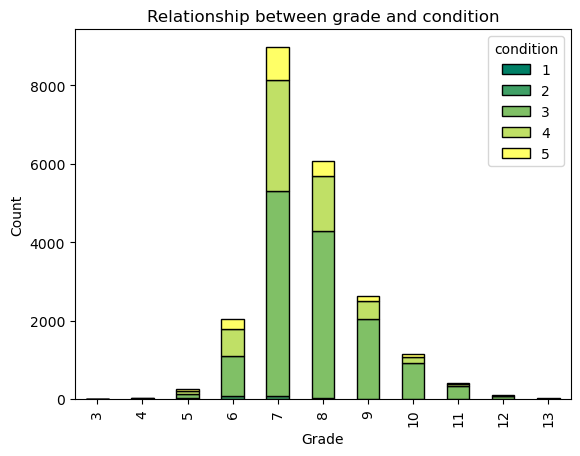

In [14]:
# We group the data by grade and condition.
grouped_data = data.groupby(['grade', 'condition']).size().unstack()

# We create a stacked bar chart.
grouped_data.plot(kind='bar', stacked=True, cmap='summer', edgecolor='black')

# And set the title and axis labels.
plt.title('Relationship between grade and condition')
plt.xlabel('Grade')
plt.ylabel('Count')

plt.show()

In [15]:
data.drop(['bathrooms', 'sqft_lot15', 'sqft_above', 'sqft_living15'], axis=1, inplace=True)

Latitude and longitude combined essentially provide us with the same as the zipcode, so we will drop them.

In [16]:
data.drop(['lat', 'long'], axis=1, inplace=True)

In [17]:
data.columns

Index(['date', 'bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
       'view', 'condition', 'grade', 'sqft_basement', 'yr_built',
       'yr_renovated', 'zipcode', 'price'],
      dtype='object')

Now we are doing a first check for outliers.

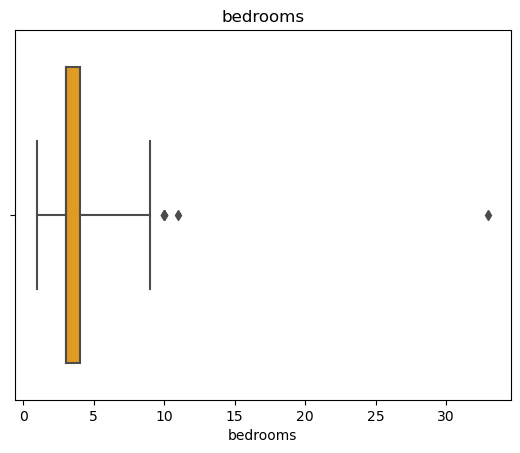

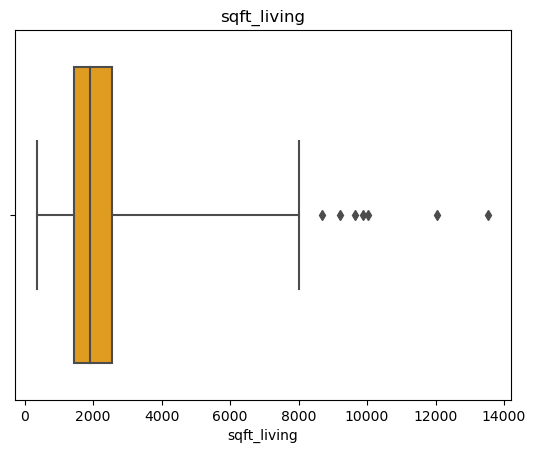

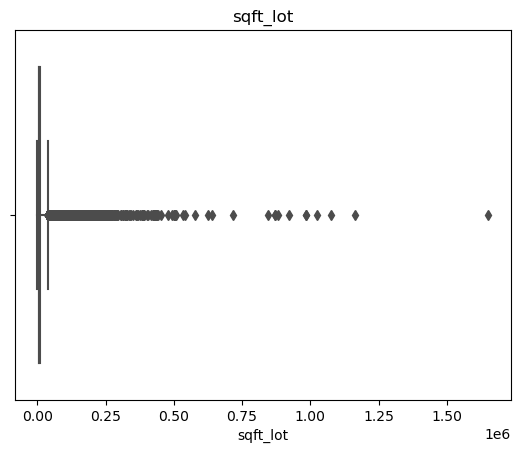

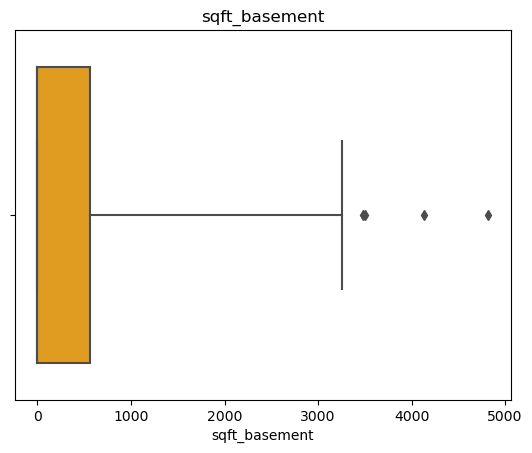

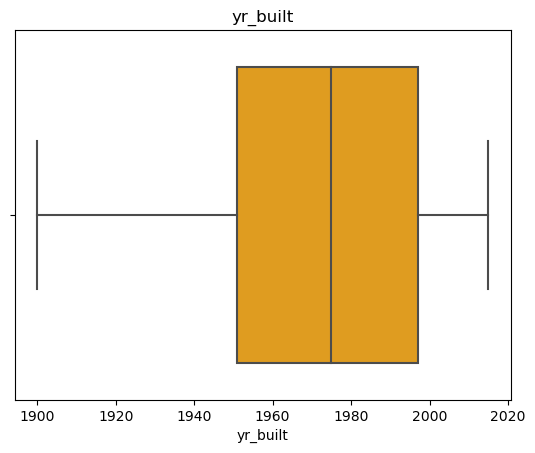

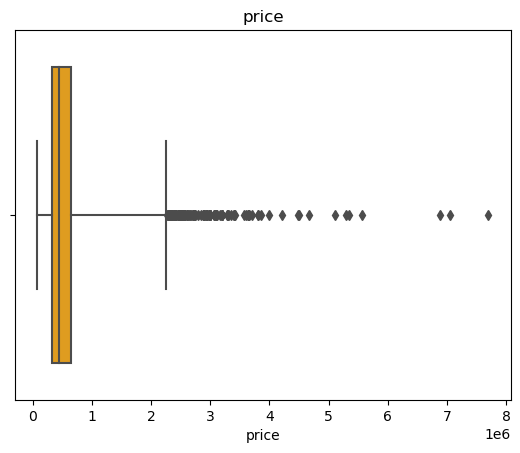

In [18]:
# To create a boxplot for the appropriate numerical columns based on prior analysis. 
cols = ['bedrooms', 'sqft_living', 'sqft_lot', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data[col], whis=5, color='orange')
    plt.title(col)
    plt.show()

# We see in most of the features there's one strong and a number of other outliers.

## 5. Data Processing 

In [19]:
filtered_rows = data.loc[data['sqft_lot'] == 1651359]
filtered_rows

,date,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_basement,yr_built,yr_renovated,zipcode,price
1717,2015-03-27,4,1300,1651359,1.0,0,3,4,6,0,1920,0,98022,700000


In [20]:
filtered_rows = data.loc[data['sqft_living'] == 13540]
filtered_rows

,date,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_basement,yr_built,yr_renovated,zipcode,price
12764,2014-05-05,7,13540,307752,3.0,0,4,3,12,4130,1999,0,98053,2280000


The maximum values of 'sqft_lot' and 'sqft_living' look unusual but not unproportional, meaning the n° of bedrooms, size of living and lot, grade and price go hand in hand. Nevertheless, keeping extreme values in our dataset can skew the results of our analysis and make it more difficult to identify the factors that are driving higher property values. 
Since we specifically want to understand which factors are responsible for higher property value - 650K and above - we will create a subset of our original dataset that includes only the properties with prices of 650K and above, and then analyze the relationship between the various features and the target variable (price) in this subset. The subset will include the heavy outliers in price, so we can observe whether they remain heavy in this new set.

First we remove the strongest outliers from the full dataset starting with 'bedrooms', then we move on to model the subset with higher prices.

In [21]:
data_high = data[data['price'] >= 650000]

In [22]:
data['bedrooms'].value_counts().max

<bound method NDFrame._add_numeric_operations.<locals>.max of 3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64>

In [23]:
filtered_rows = data[data['bedrooms'].isin([10, 11, 33])]
filtered_rows

,date,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_basement,yr_built,yr_renovated,zipcode,price
8748,2014-08-21,11,3000,4960,2.0,0,0,3,7,600,1918,1999,98106,520000
13301,2014-08-14,10,4590,10920,1.0,0,2,3,9,2090,2008,0,98004,1150000
15147,2014-10-29,10,3610,11914,2.0,0,0,4,7,600,1958,0,98006,650000
15856,2014-06-25,33,1620,6000,1.0,0,0,5,7,580,1947,0,98103,640000
19239,2014-12-29,10,2920,3745,2.0,0,0,4,7,1060,1913,0,98105,660000


In this case, the property with 33 bedrooms is significantly different from the rest of the properties and is due to the proportionaly small 'sqft_living' most likely a data entry error. Hence we remove the outlier.

There are four properties with 10 and 11 bedrooms, they all differ in their other characteristics. However, having 10/11 bedrooms in a property with 4590 sqft or less of living space would be considered very unusual and might suggest a unique floor plan or unconventional use of the space. We will consider these rows errors and remove them as well.

In [24]:
data_processed = data[~data['bedrooms'].isin([10, 11, 33])]

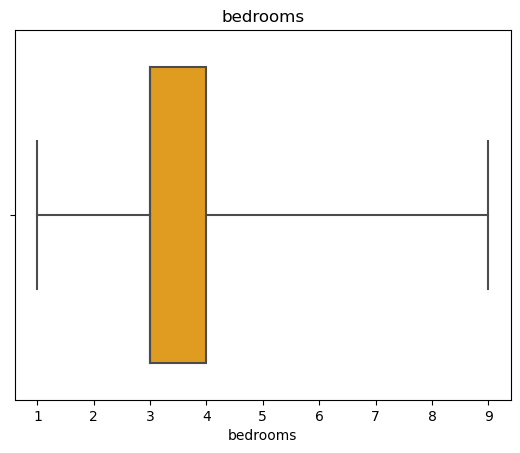

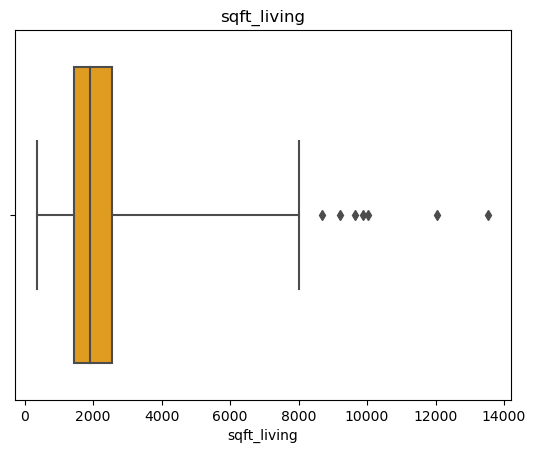

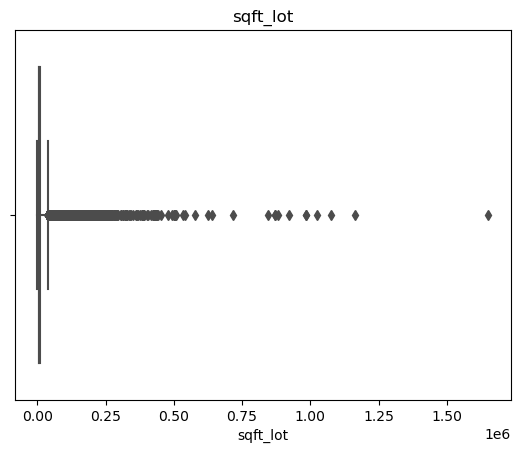

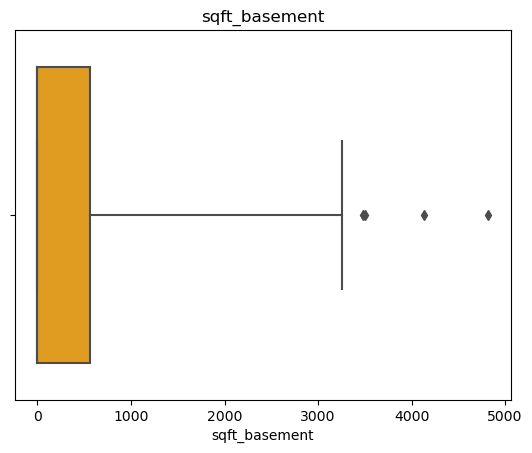

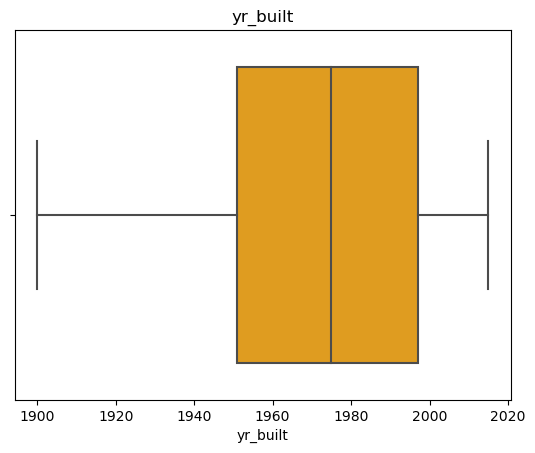

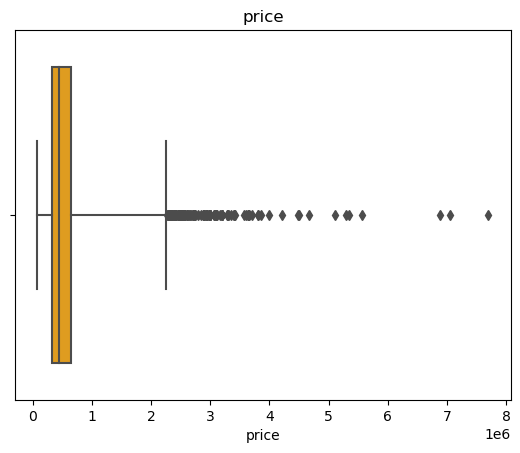

In [25]:
# Let's see if and how it affects the rest of the variables. 
cols = ['bedrooms', 'sqft_living', 'sqft_lot', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data_processed[col], whis=5, color='orange')
    plt.title(col)
    plt.show()

The plot of 'sqft_lot' shows almost only "outliers" since there are a lot of properties without any lot around the house at all. Let's look at the biggest one. 

In [26]:
filtered_rows = data_processed.loc[data_processed['sqft_lot'] == 1651359]
filtered_rows

,date,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_basement,yr_built,yr_renovated,zipcode,price
1717,2015-03-27,4,1300,1651359,1.0,0,3,4,6,0,1920,0,98022,700000


A plot size of 1,651,359 sqft is certainly possible, but it is quite large and would be considered a very large property. This property is located in the southeast of King County, WA and includes the city of Enumclaw and several nearby communities. We looked at prize by location in Tableau as below. 

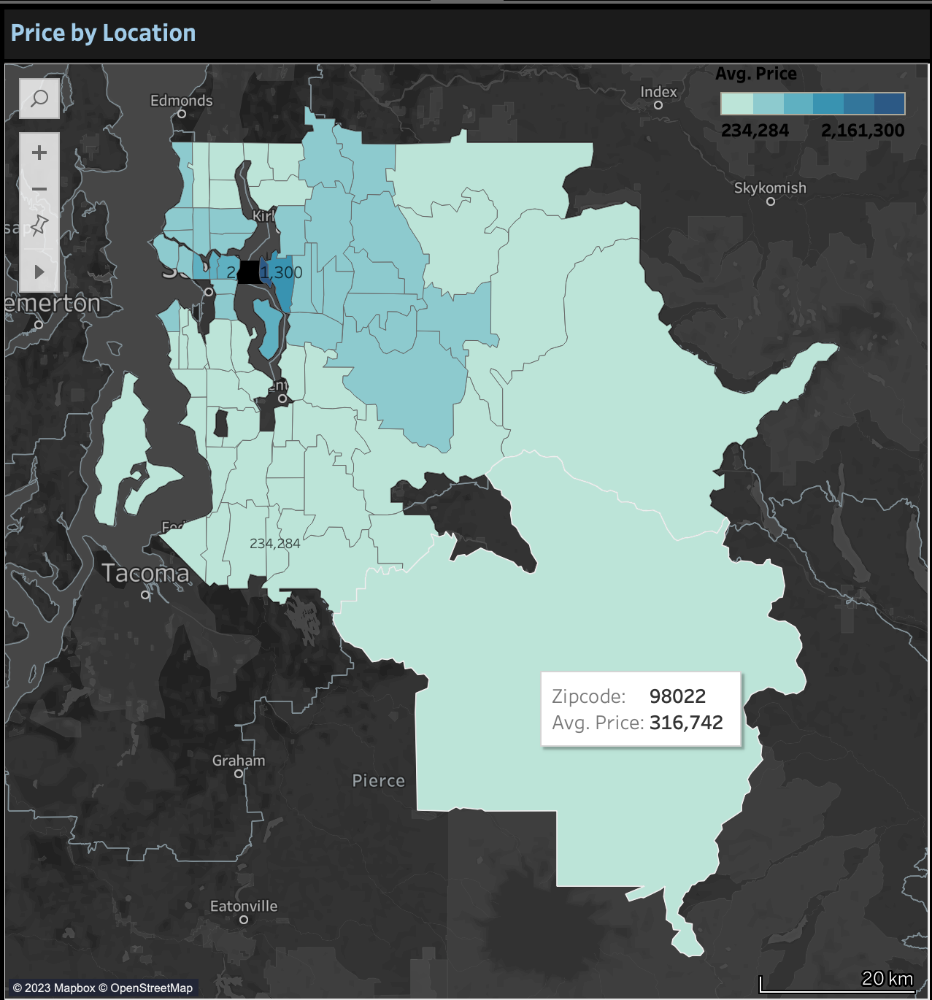

In [27]:
average_sqft_lot = data_processed[data_processed['zipcode'] == 98022]['sqft_lot'].mean()
average_sqft_lot

74233.91416309013

The price of 700,000 is possible in comparison to the average price of other properties in this zipcode. 
The average lot size in zipcode 98022 is around 74,600 sqft, hence the lot size of this outlier is comparatively large, but the zipcode contains rural areas. Based on these findings, we decide to keep this row.

We move on to reducing outliers of 'sqft_living'.

In [28]:
# We calculate the IQR to catch the outlier in 'sqft_living'. But with a larger multiplier defining the upper and lower bounds to flag fewer data points as outliers.
Q1 = data_processed['sqft_living'].quantile(0.25)
Q3 = data_processed['sqft_living'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR
data_processed = data_processed[(data_processed['sqft_living'] >= lower_bound) & (data_processed['sqft_living'] <= upper_bound)]

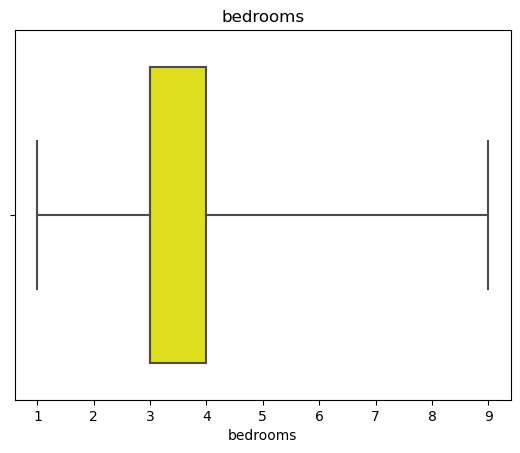

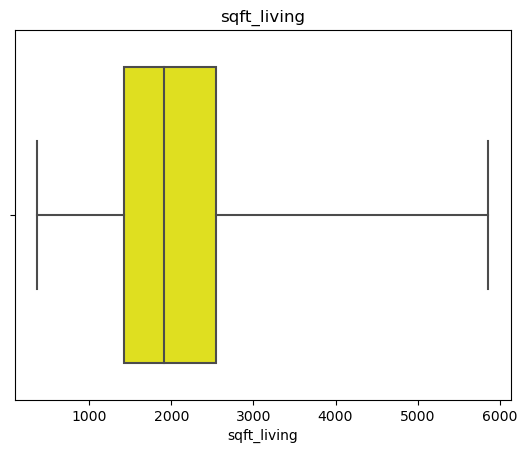

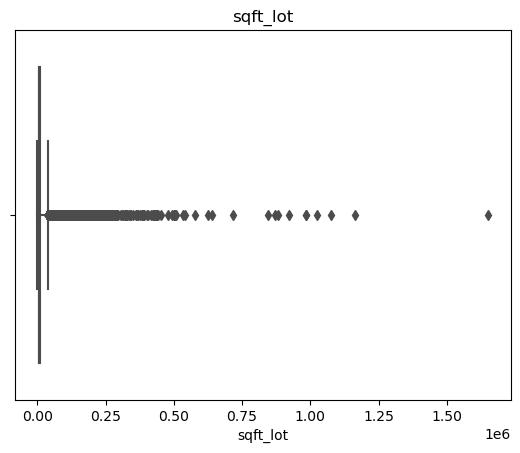

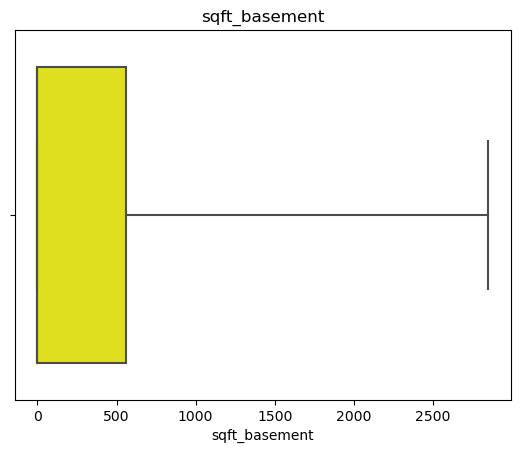

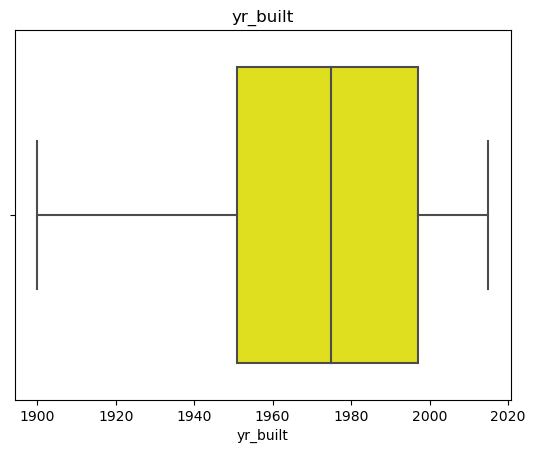

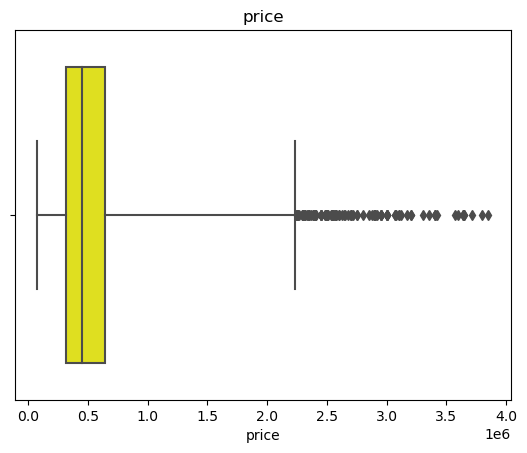

In [29]:
cols = ['bedrooms', 'sqft_living', 'sqft_lot', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data_processed[col], whis=5, color='yellow')
    plt.title(col)
    plt.show()

In [30]:
data_processed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21518 entries, 0 to 21596
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           21518 non-null  datetime64[ns]
 1   bedrooms       21518 non-null  int64         
 2   sqft_living    21518 non-null  int64         
 3   sqft_lot       21518 non-null  int64         
 4   floors         21518 non-null  float64       
 5   waterfront     21518 non-null  int64         
 6   view           21518 non-null  int64         
 7   condition      21518 non-null  int64         
 8   grade          21518 non-null  int64         
 9   sqft_basement  21518 non-null  int64         
 10  yr_built       21518 non-null  int64         
 11  yr_renovated   21518 non-null  int64         
 12  zipcode        21518 non-null  object        
 13  price          21518 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(11), object(1)
memory usage: 2

In [32]:
data_processed.to_csv('data_processed.csv')

**Now we will look at the subset with the properties of a price equal or above 650K.**

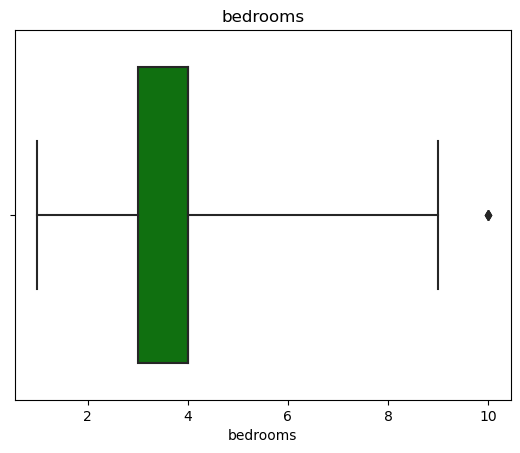

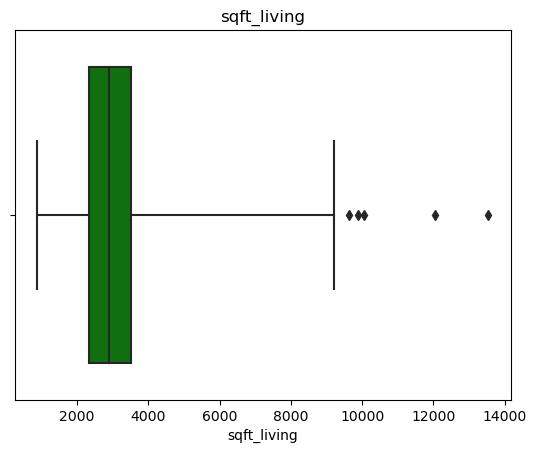

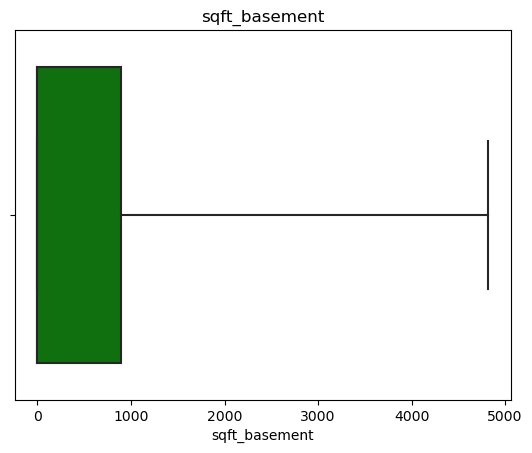

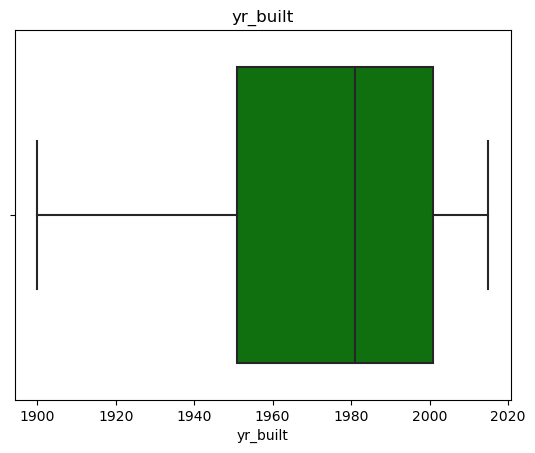

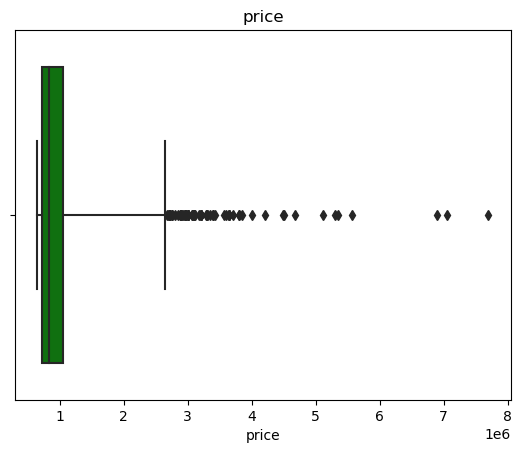

In [33]:
# Let's see how the variables behave in the subset.
cols = ['bedrooms', 'sqft_living', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data_high[col], whis=5, color='green')
    plt.title(col)
    plt.show()

Starting off, the subset looks much more coherent, there is a few outliers in the dependent variables 'bedrooms' and 'sqft_living' and heavy outliers in the independent variable which should be excluded.

In [39]:
# We calculate the IQR to catch the outlier in 'sqft_living'.
Q1 = data_high['sqft_living'].quantile(0.25)
Q3 = data_high['sqft_living'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
data_high_processed = data_high[(data_high['sqft_living'] >= lower_bound) & (data_high['sqft_living'] <= upper_bound)]

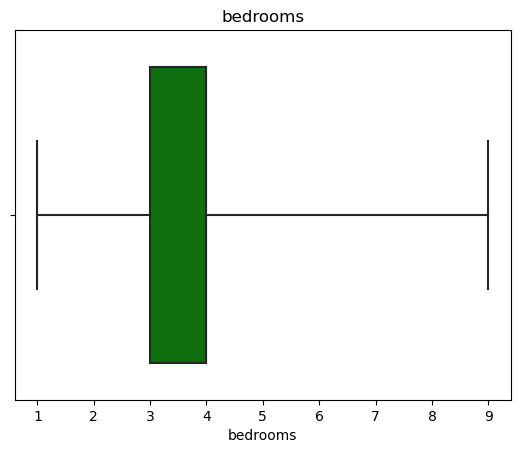

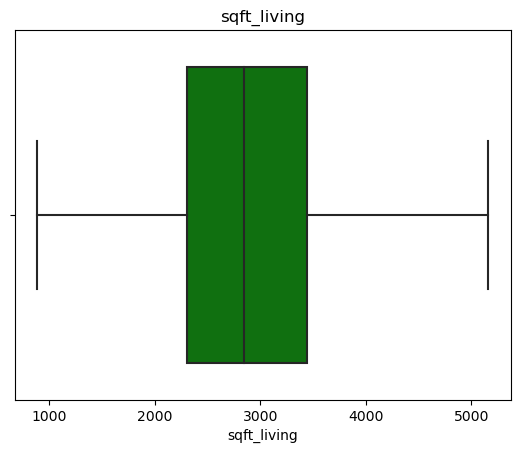

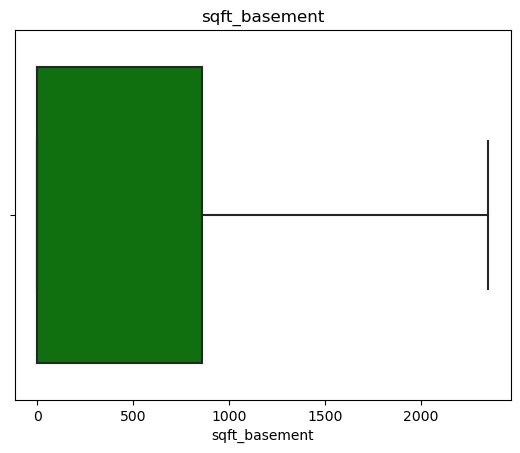

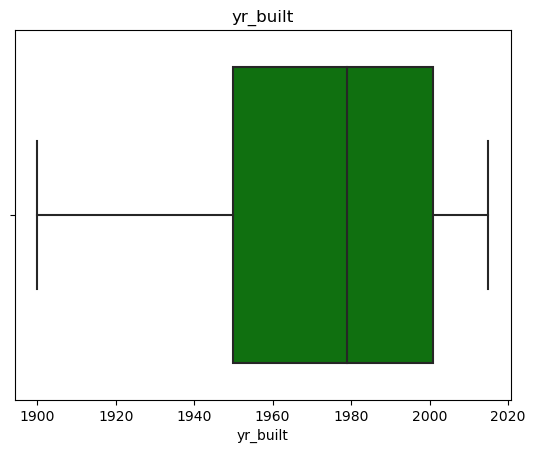

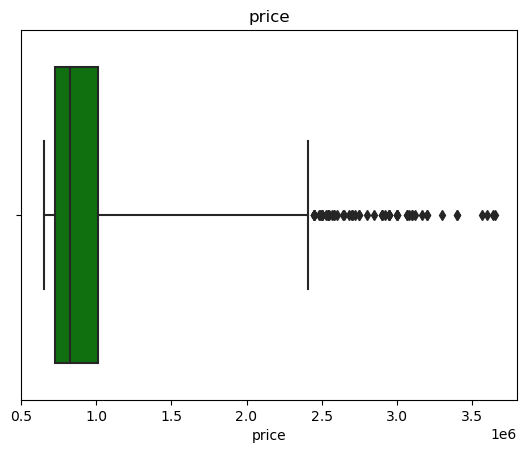

In [40]:
# Let's see if and how it affects the rest of the variables.
cols = ['bedrooms', 'sqft_living', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data_high_processed[col], whis=5, color='green')
    plt.title(col)
    plt.show()

The outlier in bedrooms remains. We have looked at these rows during preprocessing the complete dataset and considered them errors. Their removal does not impact the maximum values of the other columns. Hence we remove them also from the subset.

In [41]:
data_high_processed = data_high_processed[data_high_processed['bedrooms'] != 10]

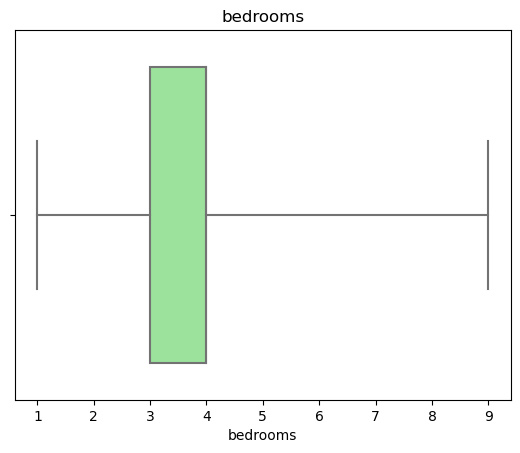

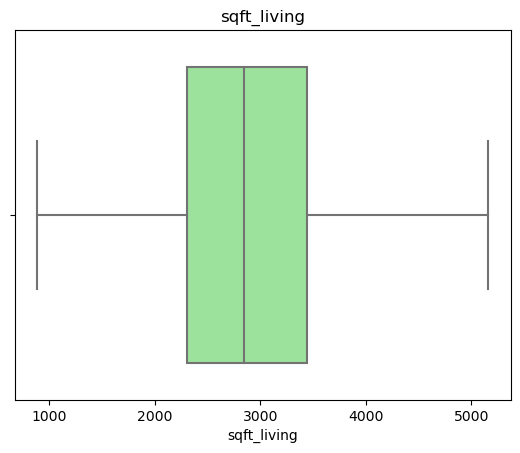

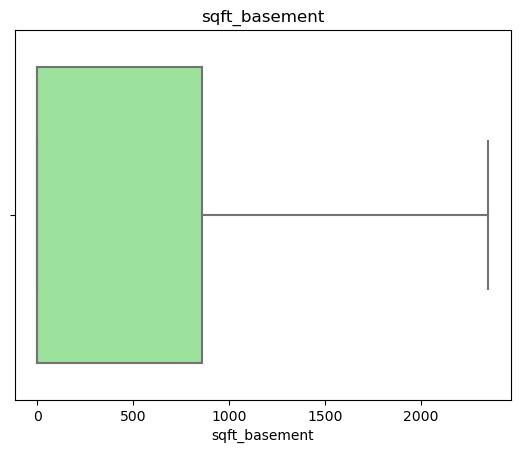

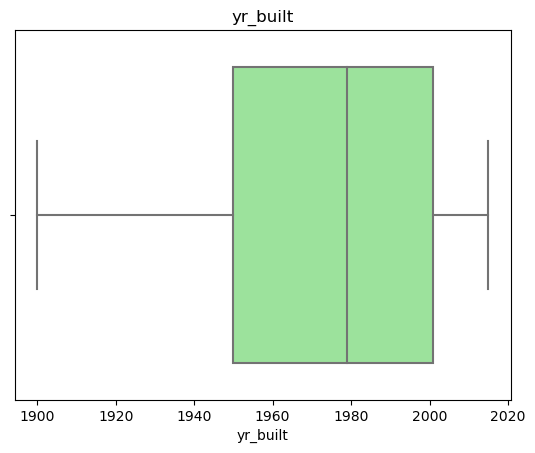

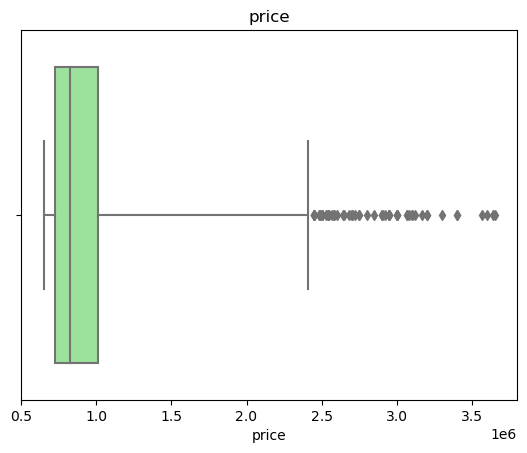

In [42]:
# Let's see if and how it affects the rest of the variables.
cols = ['bedrooms', 'sqft_living', 'sqft_basement', 'yr_built', 'price']

for col in cols:
    sns.boxplot(x=data_high_processed[col], whis=5, color='lightgreen')
    plt.title(col)
    plt.show()

In [43]:
data_high_processed.to_csv('data_650K_processed.csv')

By comparing the results of the models with and without the high-priced subset, we can gain insights into how the high-priced properties are affecting the overall trends and relationships in the data, and determine whether they are representative of the broader market or not.

## 6. Applying & Validating the Models

### Linear Regression

In [58]:
data_processed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21518 entries, 0 to 21596
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           21518 non-null  datetime64[ns]
 1   bedrooms       21518 non-null  int64         
 2   sqft_living    21518 non-null  int64         
 3   sqft_lot       21518 non-null  int64         
 4   floors         21518 non-null  float64       
 5   waterfront     21518 non-null  int64         
 6   view           21518 non-null  int64         
 7   condition      21518 non-null  int64         
 8   grade          21518 non-null  int64         
 9   sqft_basement  21518 non-null  int64         
 10  yr_built       21518 non-null  int64         
 11  yr_renovated   21518 non-null  int64         
 12  zipcode        21518 non-null  object        
 13  price          21518 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(11), object(1)
memory usage: 2

In [65]:
# We split the target from the dependent features.
y = data_processed['price']
X = data_processed.drop(['price', 'zipcode', 'date'],axis=1)

In [66]:
# We apply the train/test-split.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [67]:
len(X_train)

16138

In [68]:
len(X_test)

5380

In [69]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [70]:
predictions = model.predict(X_test)

In [71]:
# Let's validate the regression model of the full dataset processed.
r2_lin = r2_score(y_test, predictions)
RMSE_lin = mean_squared_error(y_test, predictions, squared=False)
MSE_lin = mean_squared_error(y_test, predictions)
MAE_lin = mean_absolute_error(y_test, predictions)
print("R2 = ", r2_lin)
print("RMSE = ", RMSE_lin)
print("MSE = ", MSE_lin)
print("MAE = ", MAE_lin)

R2 =  0.6484168129996128
RMSE =  206870.82123774738
MSE =  42795536679.58003
MAE =  136165.03378058897


### KNN Regression

### XGBoost